In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install albumentations==1.1.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 7.0 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20


In [3]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 927.3/927.3 kB 28.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 110.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 67.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [4]:
import torch
import torchvision
import torch.nn as nn
import cv2
import numpy as np
import os
import glob as glob
import albumentations as A
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import time
import argparse
import seaborn as sns

from torchvision.models.detection.ssd import (
    SSD,
    DefaultBoxGenerator,
    SSDHead
)
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader
from google.colab.patches import cv2_imshow
from albumentations.pytorch import ToTensorV2
from tqdm.auto import tqdm
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torch.optim.lr_scheduler import MultiStepLR
from sklearn.metrics import confusion_matrix

In [5]:
BATCH_SIZE = 16 # Increase / decrease according to GPU memeory.
RESIZE_TO = 255 # Resize the image for training and transforms.
NUM_EPOCHS = 75 # Number of epochs to train for.
NUM_WORKERS = 0 # Number of parallel workers for data loading.

DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# Training images and XML files directory.
TRAIN_DIR = '/content/drive/MyDrive/Skripsi/CobaSkripsi7/data/train'
# Validation images and XML files directory.
VALID_DIR = '/content/drive/MyDrive/Skripsi/CobaSkripsi7/data/valid'

# Classes: 0 index is reserved for background.
CLASSES = [
    '__background__', 'food', 'paper', 'plastic', 'wood'
]

NUM_CLASSES = len(CLASSES)

# Whether to visualize images after crearing the data loaders.
VISUALIZE_TRANSFORMED_IMAGES = False

# Location to save model and plots.
OUT_DIR = '/content/drive/MyDrive/Skripsi/CobaSkripsi7/outputs'

In [6]:
def create_model(num_classes=91, size=300, nms=0.45):
    model_backbone = torchvision.models.resnet34(
        weights=torchvision.models.ResNet34_Weights.DEFAULT
    )
    conv1 = model_backbone.conv1
    bn1 = model_backbone.bn1
    relu = model_backbone.relu
    max_pool = model_backbone.maxpool
    layer1 = model_backbone.layer1
    layer2 = model_backbone.layer2
    layer3 = model_backbone.layer3
    layer4 = model_backbone.layer4
    backbone = nn.Sequential(
        conv1, bn1, relu, max_pool,
        layer1, layer2, layer3, layer4
    )
    out_channels = [512, 512, 512, 512, 512, 512]
    anchor_generator = DefaultBoxGenerator(
        [[2], [2, 3], [2, 3], [2, 3], [2], [2]],
    )
    num_anchors = anchor_generator.num_anchors_per_location()
    head = SSDHead(out_channels, num_anchors, num_classes)
    model = SSD(
        backbone=backbone,
        num_classes=num_classes,
        anchor_generator=anchor_generator,
        size=(size, size),
        head=head,
        nms_thresh=nms
    )
    return model

if __name__ == '__main__':
    model = create_model(2, 300)
    print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 139MB/s]


SSD(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  

Number of training images: 560


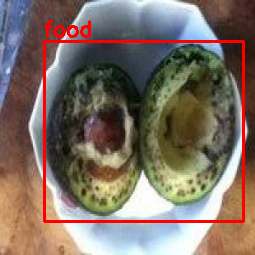

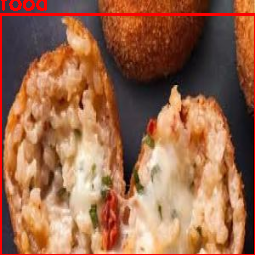

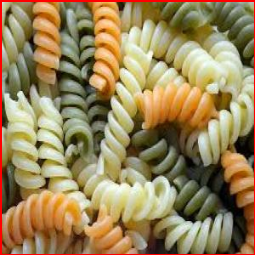

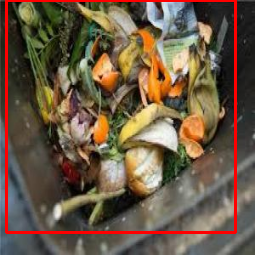

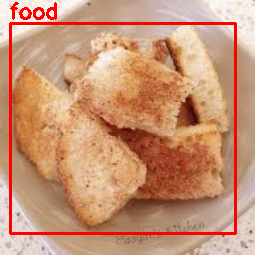

In [7]:
# The dataset class.
class CustomDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes
        self.image_file_types = ['*.jpg', '*.jpeg', '*.png', '*.ppm', '*.JPG']
        self.all_image_paths = []

        # Get all the image paths in sorted order.
        for file_type in self.image_file_types:
            self.all_image_paths.extend(glob.glob(os.path.join(self.dir_path, file_type)))
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.all_image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # Capture the image name and the full image path.
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)

        # Read and preprocess the image.
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # Capture the corresponding XML file for getting the annotations.
        annot_filename = os.path.splitext(image_name)[0] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # Original image width and height.
        image_width = image.shape[1]
        image_height = image.shape[0]

        # Box coordinates for xml files are extracted
        # and corrected for image size given.
        for member in root.findall('object'):
            # Get label and map the `classes`.
            labels.append(self.classes.index(member.find('name').text))

            # Left corner x-coordinates.
            xmin = int(member.find('bndbox').find('xmin').text)
            # Right corner x-coordinates.
            xmax = int(member.find('bndbox').find('xmax').text)
            # Left corner y-coordinates.
            ymin = int(member.find('bndbox').find('ymin').text)
            # Right corner y-coordinates.
            ymax = int(member.find('bndbox').find('ymax').text)

            # Resize the bounding boxes according
            # to resized image `width`, `height`.
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            ymax_final = (ymax/image_height)*self.height

            # Check that all coordinates are within the image.
            if xmax_final > self.width:
                xmax_final = self.width
            if ymax_final > self.height:
                ymax_final = self.height

            boxes.append([xmin_final, ymin_final, xmax_final, ymax_final])

        # Bounding box to tensor.
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # Area of the bounding boxes.
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) if len(boxes) > 0 \
            else torch.as_tensor(boxes, dtype=torch.float32)
        # No crowd instances.
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # Labels to tensor.
        labels = torch.as_tensor(labels, dtype=torch.int64)

        # Prepare the final `target` dictionary.
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id

        # Apply the image transforms.
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        if np.isnan((target['boxes']).numpy()).any() or target['boxes'].shape == torch.Size([0]):
            target['boxes'] = torch.zeros((0, 4), dtype=torch.int64)
        return image_resized, target

    def __len__(self):
        return len(self.all_images)

# Prepare the final datasets and data loaders.
def create_train_dataset(DIR):
    train_dataset = CustomDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform()
    )
    return train_dataset
def create_valid_dataset(DIR):
    valid_dataset = CustomDataset(
        DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform()
    )
    return valid_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=False
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn,
        drop_last=False
    )
    return valid_loader


# execute `datasets.py`` using Python command from
# Terminal to visualize sample images
# USAGE: python datasets.py
if __name__ == '__main__':
    # sanity check of the Dataset pipeline with sample visualization
    dataset = CustomDataset(
        TRAIN_DIR, RESIZE_TO, RESIZE_TO, CLASSES
    )
    print(f"Number of training images: {len(dataset)}")

    # function to visualize a single sample
    def visualize_sample(image, target):
        for box_num in range(len(target['boxes'])):
            box = target['boxes'][box_num]
            label = CLASSES[target['labels'][box_num]]
            normalized_image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
            # Convert the normalized image to 8-bit format for display
            display_image = normalized_image.astype(np.uint8)
            image = cv2.cvtColor(display_image, cv2.COLOR_RGB2BGR)
            cv2.rectangle(
                image,
                (int(box[0]), int(box[1])), (int(box[2]), int(box[3])),
                (0, 0, 255),
                2
            )
            cv2.putText(
                image,
                label,
                (int(box[0]), int(box[1]-5)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.7,
                (0, 0, 255),
                2
            )
        cv2_imshow(image)
        # cv2.waitKey(0)

    NUM_SAMPLES_TO_VISUALIZE = 5
    for i in range(NUM_SAMPLES_TO_VISUALIZE):
        image, target = dataset[i]
        visualize_sample(image, target)

In [8]:
plt.style.use('ggplot')

# This class keeps track of the training and validation loss values
# and helps to get the average for each epoch as well.
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation mAP @0.5:0.95 IoU higher than the previous highest, then save the
    model state.
    """
    def __init__(
        self, best_valid_map=float(0)
    ):
        self.best_valid_map = best_valid_map

    def __call__(
        self,
        model,
        current_valid_map,
        epoch,
        OUT_DIR,
    ):
        if current_valid_map > self.best_valid_map:
            self.best_valid_map = current_valid_map
            print(f"\nBEST VALIDATION mAP: {self.best_valid_map}")
            print(f"\nSAVING BEST MODEL FOR EPOCH: {epoch+1}\n")
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                }, f"{OUT_DIR}/best_model_resnet34_sgd_0.01.pth")

def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))

# Define the training tranforms.
def get_train_transform():
    return A.Compose([
        A.HorizontalFlip(p=0.5),
        A.Blur(blur_limit=3, p=0.1),
        A.MotionBlur(blur_limit=3, p=0.1),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.ToGray(p=0.3),
        A.RandomBrightnessContrast(p=0.3),
        A.ColorJitter(p=0.3),
        A.RandomGamma(p=0.3),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })

# Define the validation transforms.
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })


def show_tranformed_image(train_loader):
    """
    This function shows the transformed images from the `train_loader`.
    Helps to check whether the tranformed images along with the corresponding
    labels are correct or not.
    Only runs if `VISUALIZE_TRANSFORMED_IMAGES = True` in config.py.
    """
    if len(train_loader) > 0:
        for i in range(1):
            images, targets = next(iter(train_loader))
            images = list(image.to(DEVICE) for image in images)
            targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)
            sample = images[i].permute(1, 2, 0).cpu().numpy()
            sample = cv2.cvtColor(sample, cv2.COLOR_RGB2BGR)
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                            (box[0], box[1]),
                            (box[2], box[3]),
                            (0, 0, 255), 2)
                cv2.putText(sample, CLASSES[labels[box_num]],
                            (box[0], box[1]-10), cv2.FONT_HERSHEY_SIMPLEX,
                            1.0, (0, 0, 255), 2)
            cv2.imshow('Transformed image', sample)
            cv2.waitKey(0)
            cv2.destroyAllWindows()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, f'{OUT_DIR}/last_model_resnet34_sgd_0.01.pth')

def save_loss_plot(
    OUT_DIR,
    train_loss_list,
    x_label='iterations',
    y_label='train loss',
    save_name='train_loss'
):
    """
    Function to save both train loss graph.

    :param OUT_DIR: Path to save the graphs.
    :param train_loss_list: List containing the training loss values.
    """
    figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)
    train_ax = figure_1.add_subplot()
    train_ax.plot(train_loss_list, color='tab:blue')
    train_ax.set_xlabel(x_label)
    train_ax.set_ylabel(y_label)
    figure_1.savefig(f"{OUT_DIR}/{save_name}_resnet34_sgd_0.01.png")
    print('SAVING PLOTS COMPLETE...')

def save_mAP(OUT_DIR, map_05, map):
    """
    Saves the mAP@0.5 and mAP@0.5:0.95 per epoch.
    :param OUT_DIR: Path to save the graphs.
    :param map_05: List containing mAP values at 0.5 IoU.
    :param map: List containing mAP values at 0.5:0.95 IoU.
    """
    figure = plt.figure(figsize=(10, 7), num=1, clear=True)
    ax = figure.add_subplot()
    ax.plot(
        map_05, color='tab:orange', linestyle='-',
        label='mAP@0.5'
    )
    ax.plot(
        map, color='tab:red', linestyle='-',
        label='mAP@0.5:0.95'
    )
    ax.set_xlabel('Epochs')
    ax.set_ylabel('mAP')
    ax.legend()
    figure.savefig(f"{OUT_DIR}/map_resnet34_sgd_0.01.png")

Number of training samples: 560
Number of validation samples: 160

SSD(
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64,

  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


Epoch #1 train loss: 64.873
Epoch #1 mAP@0.50:0.95: 0.006154498551040888
Epoch #1 mAP@0.50: 0.02304639294743538
Took 0.332 minutes for epoch 0

BEST VALIDATION mAP: 0.006154498551040888

SAVING BEST MODEL FOR EPOCH: 1

SAVING PLOTS COMPLETE...

EPOCH 2 of 75
Training


<ipython-input-8-6e25c78fd820>:152: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  figure = plt.figure(figsize=(10, 7), num=1, clear=True)


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #2 train loss: 8.897
Epoch #2 mAP@0.50:0.95: 0.17497248947620392
Epoch #2 mAP@0.50: 0.3232434093952179
Took 0.221 minutes for epoch 1

BEST VALIDATION mAP: 0.17497248947620392

SAVING BEST MODEL FOR EPOCH: 2

SAVING PLOTS COMPLETE...

EPOCH 3 of 75
Training


<ipython-input-8-6e25c78fd820>:137: UserWarning: Ignoring specified arguments in this call because figure with num: 1 already exists
  figure_1 = plt.figure(figsize=(10, 7), num=1, clear=True)


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #3 train loss: 7.750
Epoch #3 mAP@0.50:0.95: 0.1910647749900818
Epoch #3 mAP@0.50: 0.339646577835083
Took 0.235 minutes for epoch 2

BEST VALIDATION mAP: 0.1910647749900818

SAVING BEST MODEL FOR EPOCH: 3

SAVING PLOTS COMPLETE...

EPOCH 4 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #4 train loss: 7.269
Epoch #4 mAP@0.50:0.95: 0.18390581011772156
Epoch #4 mAP@0.50: 0.32485613226890564
Took 0.224 minutes for epoch 3
SAVING PLOTS COMPLETE...

EPOCH 5 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #5 train loss: 7.130
Epoch #5 mAP@0.50:0.95: 0.23629921674728394
Epoch #5 mAP@0.50: 0.3685574233531952
Took 0.219 minutes for epoch 4

BEST VALIDATION mAP: 0.23629921674728394

SAVING BEST MODEL FOR EPOCH: 5

SAVING PLOTS COMPLETE...

EPOCH 6 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #6 train loss: 6.748
Epoch #6 mAP@0.50:0.95: 0.13464181125164032
Epoch #6 mAP@0.50: 0.33222049474716187
Took 0.226 minutes for epoch 5
SAVING PLOTS COMPLETE...

EPOCH 7 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #7 train loss: 6.403
Epoch #7 mAP@0.50:0.95: 0.27449458837509155
Epoch #7 mAP@0.50: 0.42089372873306274
Took 0.222 minutes for epoch 6

BEST VALIDATION mAP: 0.27449458837509155

SAVING BEST MODEL FOR EPOCH: 7

SAVING PLOTS COMPLETE...

EPOCH 8 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #8 train loss: 6.261
Epoch #8 mAP@0.50:0.95: 0.1486562043428421
Epoch #8 mAP@0.50: 0.35981374979019165
Took 0.229 minutes for epoch 7
SAVING PLOTS COMPLETE...

EPOCH 9 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #9 train loss: 6.513
Epoch #9 mAP@0.50:0.95: 0.24658864736557007
Epoch #9 mAP@0.50: 0.371277779340744
Took 0.223 minutes for epoch 8
SAVING PLOTS COMPLETE...

EPOCH 10 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #10 train loss: 6.408
Epoch #10 mAP@0.50:0.95: 0.1711030751466751
Epoch #10 mAP@0.50: 0.32350659370422363
Took 0.222 minutes for epoch 9
SAVING PLOTS COMPLETE...

EPOCH 11 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #11 train loss: 6.470
Epoch #11 mAP@0.50:0.95: 0.2660982608795166
Epoch #11 mAP@0.50: 0.4201829731464386
Took 0.222 minutes for epoch 10
SAVING PLOTS COMPLETE...

EPOCH 12 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #12 train loss: 6.147
Epoch #12 mAP@0.50:0.95: 0.26490354537963867
Epoch #12 mAP@0.50: 0.3906550407409668
Took 0.218 minutes for epoch 11
SAVING PLOTS COMPLETE...

EPOCH 13 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #13 train loss: 6.097
Epoch #13 mAP@0.50:0.95: 0.27900728583335876
Epoch #13 mAP@0.50: 0.42172756791114807
Took 0.220 minutes for epoch 12

BEST VALIDATION mAP: 0.27900728583335876

SAVING BEST MODEL FOR EPOCH: 13

SAVING PLOTS COMPLETE...

EPOCH 14 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #14 train loss: 6.151
Epoch #14 mAP@0.50:0.95: 0.2218553125858307
Epoch #14 mAP@0.50: 0.39508864283561707
Took 0.220 minutes for epoch 13
SAVING PLOTS COMPLETE...

EPOCH 15 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #15 train loss: 6.028
Epoch #15 mAP@0.50:0.95: 0.20625214278697968
Epoch #15 mAP@0.50: 0.37758880853652954
Took 0.226 minutes for epoch 14
SAVING PLOTS COMPLETE...

EPOCH 16 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #16 train loss: 5.991
Epoch #16 mAP@0.50:0.95: 0.27823081612586975
Epoch #16 mAP@0.50: 0.38774406909942627
Took 0.219 minutes for epoch 15
SAVING PLOTS COMPLETE...

EPOCH 17 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #17 train loss: 6.321
Epoch #17 mAP@0.50:0.95: 0.2586006820201874
Epoch #17 mAP@0.50: 0.3655664920806885
Took 0.219 minutes for epoch 16
SAVING PLOTS COMPLETE...

EPOCH 18 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #18 train loss: 6.074
Epoch #18 mAP@0.50:0.95: 0.25835442543029785
Epoch #18 mAP@0.50: 0.38564661145210266
Took 0.219 minutes for epoch 17
SAVING PLOTS COMPLETE...

EPOCH 19 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #19 train loss: 7.053
Epoch #19 mAP@0.50:0.95: 0.2333657443523407
Epoch #19 mAP@0.50: 0.34293094277381897
Took 0.228 minutes for epoch 18
SAVING PLOTS COMPLETE...

EPOCH 20 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #20 train loss: 6.216
Epoch #20 mAP@0.50:0.95: 0.26351723074913025
Epoch #20 mAP@0.50: 0.395870566368103
Took 0.218 minutes for epoch 19
SAVING PLOTS COMPLETE...

EPOCH 21 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #21 train loss: 6.072
Epoch #21 mAP@0.50:0.95: 0.18282605707645416
Epoch #21 mAP@0.50: 0.4131019413471222
Took 0.225 minutes for epoch 20
SAVING PLOTS COMPLETE...

EPOCH 22 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #22 train loss: 6.075
Epoch #22 mAP@0.50:0.95: 0.27176058292388916
Epoch #22 mAP@0.50: 0.42726218700408936
Took 0.227 minutes for epoch 21
SAVING PLOTS COMPLETE...

EPOCH 23 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #23 train loss: 5.811
Epoch #23 mAP@0.50:0.95: 0.27819088101387024
Epoch #23 mAP@0.50: 0.39753347635269165
Took 0.229 minutes for epoch 22
SAVING PLOTS COMPLETE...

EPOCH 24 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #24 train loss: 5.705
Epoch #24 mAP@0.50:0.95: 0.3083731234073639
Epoch #24 mAP@0.50: 0.45829254388809204
Took 0.227 minutes for epoch 23

BEST VALIDATION mAP: 0.3083731234073639

SAVING BEST MODEL FOR EPOCH: 24

SAVING PLOTS COMPLETE...

EPOCH 25 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #25 train loss: 5.684
Epoch #25 mAP@0.50:0.95: 0.26714351773262024
Epoch #25 mAP@0.50: 0.382882684469223
Took 0.236 minutes for epoch 24
SAVING PLOTS COMPLETE...

EPOCH 26 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #26 train loss: 5.795
Epoch #26 mAP@0.50:0.95: 0.27432775497436523
Epoch #26 mAP@0.50: 0.4094671905040741
Took 0.229 minutes for epoch 25
SAVING PLOTS COMPLETE...

EPOCH 27 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #27 train loss: 6.214
Epoch #27 mAP@0.50:0.95: 0.16784872114658356
Epoch #27 mAP@0.50: 0.36695149540901184
Took 0.223 minutes for epoch 26
SAVING PLOTS COMPLETE...

EPOCH 28 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #28 train loss: 5.660
Epoch #28 mAP@0.50:0.95: 0.27983522415161133
Epoch #28 mAP@0.50: 0.4635438919067383
Took 0.229 minutes for epoch 27
SAVING PLOTS COMPLETE...

EPOCH 29 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #29 train loss: 5.634
Epoch #29 mAP@0.50:0.95: 0.26494506001472473
Epoch #29 mAP@0.50: 0.40614405274391174
Took 0.226 minutes for epoch 28
SAVING PLOTS COMPLETE...

EPOCH 30 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #30 train loss: 5.601
Epoch #30 mAP@0.50:0.95: 0.2550392746925354
Epoch #30 mAP@0.50: 0.45830076932907104
Took 0.230 minutes for epoch 29
SAVING PLOTS COMPLETE...

EPOCH 31 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #31 train loss: 5.486
Epoch #31 mAP@0.50:0.95: 0.29433175921440125
Epoch #31 mAP@0.50: 0.432873010635376
Took 0.229 minutes for epoch 30
SAVING PLOTS COMPLETE...

EPOCH 32 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #32 train loss: 5.495
Epoch #32 mAP@0.50:0.95: 0.241629958152771
Epoch #32 mAP@0.50: 0.4903266429901123
Took 0.219 minutes for epoch 31
SAVING PLOTS COMPLETE...

EPOCH 33 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #33 train loss: 5.561
Epoch #33 mAP@0.50:0.95: 0.2770040035247803
Epoch #33 mAP@0.50: 0.46568116545677185
Took 0.232 minutes for epoch 32
SAVING PLOTS COMPLETE...

EPOCH 34 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #34 train loss: 5.370
Epoch #34 mAP@0.50:0.95: 0.2557550370693207
Epoch #34 mAP@0.50: 0.44980689883232117
Took 0.224 minutes for epoch 33
SAVING PLOTS COMPLETE...

EPOCH 35 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #35 train loss: 5.258
Epoch #35 mAP@0.50:0.95: 0.27299562096595764
Epoch #35 mAP@0.50: 0.45214220881462097
Took 0.226 minutes for epoch 34
SAVING PLOTS COMPLETE...

EPOCH 36 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #36 train loss: 5.449
Epoch #36 mAP@0.50:0.95: 0.3066646456718445
Epoch #36 mAP@0.50: 0.48028677701950073
Took 0.226 minutes for epoch 35
SAVING PLOTS COMPLETE...

EPOCH 37 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #37 train loss: 5.453
Epoch #37 mAP@0.50:0.95: 0.3237902522087097
Epoch #37 mAP@0.50: 0.49015387892723083
Took 0.226 minutes for epoch 36

BEST VALIDATION mAP: 0.3237902522087097

SAVING BEST MODEL FOR EPOCH: 37

SAVING PLOTS COMPLETE...

EPOCH 38 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #38 train loss: 5.246
Epoch #38 mAP@0.50:0.95: 0.28881895542144775
Epoch #38 mAP@0.50: 0.4899437725543976
Took 0.235 minutes for epoch 37
SAVING PLOTS COMPLETE...

EPOCH 39 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #39 train loss: 5.118
Epoch #39 mAP@0.50:0.95: 0.2737003564834595
Epoch #39 mAP@0.50: 0.4832684397697449
Took 0.228 minutes for epoch 38
SAVING PLOTS COMPLETE...

EPOCH 40 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #40 train loss: 5.392
Epoch #40 mAP@0.50:0.95: 0.306926965713501
Epoch #40 mAP@0.50: 0.47024819254875183
Took 0.221 minutes for epoch 39
SAVING PLOTS COMPLETE...

EPOCH 41 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #41 train loss: 5.168
Epoch #41 mAP@0.50:0.95: 0.2918379604816437
Epoch #41 mAP@0.50: 0.5076839327812195
Took 0.221 minutes for epoch 40
SAVING PLOTS COMPLETE...

EPOCH 42 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #42 train loss: 5.157
Epoch #42 mAP@0.50:0.95: 0.2156057357788086
Epoch #42 mAP@0.50: 0.46552491188049316
Took 0.225 minutes for epoch 41
SAVING PLOTS COMPLETE...

EPOCH 43 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #43 train loss: 5.188
Epoch #43 mAP@0.50:0.95: 0.3049180209636688
Epoch #43 mAP@0.50: 0.47499316930770874
Took 0.223 minutes for epoch 42
SAVING PLOTS COMPLETE...

EPOCH 44 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #44 train loss: 5.117
Epoch #44 mAP@0.50:0.95: 0.31712207198143005
Epoch #44 mAP@0.50: 0.5197916030883789
Took 0.222 minutes for epoch 43
SAVING PLOTS COMPLETE...

EPOCH 45 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #45 train loss: 5.032
Epoch #45 mAP@0.50:0.95: 0.3132271468639374
Epoch #45 mAP@0.50: 0.5100185871124268
Took 0.219 minutes for epoch 44
SAVING PLOTS COMPLETE...

EPOCH 46 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #46 train loss: 4.857
Epoch #46 mAP@0.50:0.95: 0.3302125632762909
Epoch #46 mAP@0.50: 0.5167632699012756
Took 0.225 minutes for epoch 45

BEST VALIDATION mAP: 0.3302125632762909

SAVING BEST MODEL FOR EPOCH: 46

SAVING PLOTS COMPLETE...

EPOCH 47 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #47 train loss: 4.804
Epoch #47 mAP@0.50:0.95: 0.3367486000061035
Epoch #47 mAP@0.50: 0.5035780668258667
Took 0.223 minutes for epoch 46

BEST VALIDATION mAP: 0.3367486000061035

SAVING BEST MODEL FOR EPOCH: 47

SAVING PLOTS COMPLETE...

EPOCH 48 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #48 train loss: 4.859
Epoch #48 mAP@0.50:0.95: 0.3382055163383484
Epoch #48 mAP@0.50: 0.5187976956367493
Took 0.222 minutes for epoch 47

BEST VALIDATION mAP: 0.3382055163383484

SAVING BEST MODEL FOR EPOCH: 48

SAVING PLOTS COMPLETE...

EPOCH 49 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #49 train loss: 5.575
Epoch #49 mAP@0.50:0.95: 0.33979570865631104
Epoch #49 mAP@0.50: 0.5200508832931519
Took 0.222 minutes for epoch 48

BEST VALIDATION mAP: 0.33979570865631104

SAVING BEST MODEL FOR EPOCH: 49

SAVING PLOTS COMPLETE...

EPOCH 50 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #50 train loss: 5.038
Epoch #50 mAP@0.50:0.95: 0.30777713656425476
Epoch #50 mAP@0.50: 0.4890836477279663
Took 0.224 minutes for epoch 49
SAVING PLOTS COMPLETE...

EPOCH 51 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #51 train loss: 4.790
Epoch #51 mAP@0.50:0.95: 0.3261178135871887
Epoch #51 mAP@0.50: 0.5040867328643799
Took 0.224 minutes for epoch 50
SAVING PLOTS COMPLETE...

EPOCH 52 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #52 train loss: 4.819
Epoch #52 mAP@0.50:0.95: 0.33565986156463623
Epoch #52 mAP@0.50: 0.5133873224258423
Took 0.220 minutes for epoch 51
SAVING PLOTS COMPLETE...

EPOCH 53 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #53 train loss: 4.769
Epoch #53 mAP@0.50:0.95: 0.3371865153312683
Epoch #53 mAP@0.50: 0.518707275390625
Took 0.224 minutes for epoch 52
SAVING PLOTS COMPLETE...

EPOCH 54 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #54 train loss: 4.692
Epoch #54 mAP@0.50:0.95: 0.3350560665130615
Epoch #54 mAP@0.50: 0.5206417441368103
Took 0.222 minutes for epoch 53
SAVING PLOTS COMPLETE...

EPOCH 55 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #55 train loss: 4.847
Epoch #55 mAP@0.50:0.95: 0.32790032029151917
Epoch #55 mAP@0.50: 0.5120583176612854
Took 0.225 minutes for epoch 54
SAVING PLOTS COMPLETE...

EPOCH 56 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #56 train loss: 4.754
Epoch #56 mAP@0.50:0.95: 0.3283562660217285
Epoch #56 mAP@0.50: 0.5069085955619812
Took 0.222 minutes for epoch 55
SAVING PLOTS COMPLETE...

EPOCH 57 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #57 train loss: 4.673
Epoch #57 mAP@0.50:0.95: 0.3263813257217407
Epoch #57 mAP@0.50: 0.5147967338562012
Took 0.222 minutes for epoch 56
SAVING PLOTS COMPLETE...

EPOCH 58 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #58 train loss: 4.785
Epoch #58 mAP@0.50:0.95: 0.3216262757778168
Epoch #58 mAP@0.50: 0.503654956817627
Took 0.220 minutes for epoch 57
SAVING PLOTS COMPLETE...

EPOCH 59 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #59 train loss: 4.733
Epoch #59 mAP@0.50:0.95: 0.3299005627632141
Epoch #59 mAP@0.50: 0.5189669132232666
Took 0.222 minutes for epoch 58
SAVING PLOTS COMPLETE...

EPOCH 60 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #60 train loss: 4.911
Epoch #60 mAP@0.50:0.95: 0.31162503361701965
Epoch #60 mAP@0.50: 0.49616408348083496
Took 0.224 minutes for epoch 59
SAVING PLOTS COMPLETE...

EPOCH 61 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #61 train loss: 4.873
Epoch #61 mAP@0.50:0.95: 0.32973575592041016
Epoch #61 mAP@0.50: 0.5046564340591431
Took 0.221 minutes for epoch 60
SAVING PLOTS COMPLETE...

EPOCH 62 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #62 train loss: 4.774
Epoch #62 mAP@0.50:0.95: 0.32612302899360657
Epoch #62 mAP@0.50: 0.5051828026771545
Took 0.228 minutes for epoch 61
SAVING PLOTS COMPLETE...

EPOCH 63 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #63 train loss: 4.988
Epoch #63 mAP@0.50:0.95: 0.31057289242744446
Epoch #63 mAP@0.50: 0.4910464286804199
Took 0.226 minutes for epoch 62
SAVING PLOTS COMPLETE...

EPOCH 64 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #64 train loss: 4.738
Epoch #64 mAP@0.50:0.95: 0.32761532068252563
Epoch #64 mAP@0.50: 0.4992118775844574
Took 0.217 minutes for epoch 63
SAVING PLOTS COMPLETE...

EPOCH 65 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #65 train loss: 4.829
Epoch #65 mAP@0.50:0.95: 0.31658223271369934
Epoch #65 mAP@0.50: 0.5032836198806763
Took 0.219 minutes for epoch 64
SAVING PLOTS COMPLETE...

EPOCH 66 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #66 train loss: 4.669
Epoch #66 mAP@0.50:0.95: 0.3391032814979553
Epoch #66 mAP@0.50: 0.5175004601478577
Took 0.219 minutes for epoch 65
SAVING PLOTS COMPLETE...

EPOCH 67 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #67 train loss: 5.452
Epoch #67 mAP@0.50:0.95: 0.30345720052719116
Epoch #67 mAP@0.50: 0.48649466037750244
Took 0.219 minutes for epoch 66
SAVING PLOTS COMPLETE...

EPOCH 68 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #68 train loss: 4.866
Epoch #68 mAP@0.50:0.95: 0.3294612765312195
Epoch #68 mAP@0.50: 0.50998455286026
Took 0.221 minutes for epoch 67
SAVING PLOTS COMPLETE...

EPOCH 69 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #69 train loss: 4.877
Epoch #69 mAP@0.50:0.95: 0.3274320662021637
Epoch #69 mAP@0.50: 0.5090304017066956
Took 0.219 minutes for epoch 68
SAVING PLOTS COMPLETE...

EPOCH 70 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #70 train loss: 4.668
Epoch #70 mAP@0.50:0.95: 0.32720524072647095
Epoch #70 mAP@0.50: 0.5128759145736694
Took 0.219 minutes for epoch 69
SAVING PLOTS COMPLETE...

EPOCH 71 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #71 train loss: 4.801
Epoch #71 mAP@0.50:0.95: 0.33220016956329346
Epoch #71 mAP@0.50: 0.5171361565589905
Took 0.218 minutes for epoch 70
SAVING PLOTS COMPLETE...

EPOCH 72 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #72 train loss: 4.679
Epoch #72 mAP@0.50:0.95: 0.330551415681839
Epoch #72 mAP@0.50: 0.5148957967758179
Took 0.219 minutes for epoch 71
SAVING PLOTS COMPLETE...

EPOCH 73 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #73 train loss: 4.717
Epoch #73 mAP@0.50:0.95: 0.3421693444252014
Epoch #73 mAP@0.50: 0.5228789448738098
Took 0.216 minutes for epoch 72

BEST VALIDATION mAP: 0.3421693444252014

SAVING BEST MODEL FOR EPOCH: 73

SAVING PLOTS COMPLETE...

EPOCH 74 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #74 train loss: 4.712
Epoch #74 mAP@0.50:0.95: 0.33155372738838196
Epoch #74 mAP@0.50: 0.51292484998703
Took 0.215 minutes for epoch 73
SAVING PLOTS COMPLETE...

EPOCH 75 of 75
Training


  0%|          | 0/35 [00:00<?, ?it/s]

Validating


  0%|          | 0/10 [00:00<?, ?it/s]

Epoch #75 train loss: 4.701
Epoch #75 mAP@0.50:0.95: 0.3285493552684784
Epoch #75 mAP@0.50: 0.5180700421333313
Took 0.220 minutes for epoch 74
SAVING PLOTS COMPLETE...


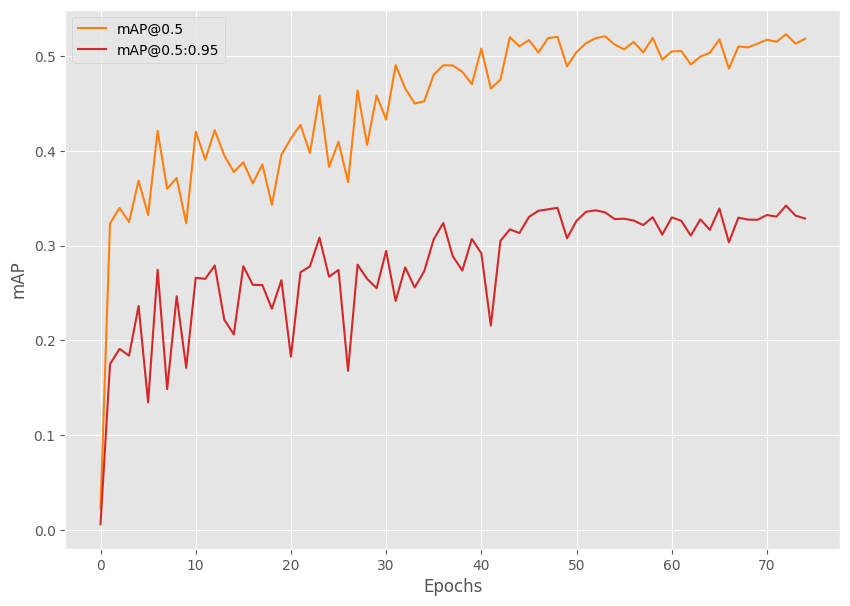

In [ ]:
plt.style.use('ggplot')

seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

# Function for running training iterations.
def train(train_data_loader, model):
    print('Training')
    model.train()

     # initialize tqdm progress bar
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        optimizer.zero_grad()
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)

        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()

        train_loss_hist.send(loss_value)

        losses.backward()
        optimizer.step()

        # update the loss value beside the progress bar for each iteration
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")
    return loss_value

# Function for running validation iterations.
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []
    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)
        #####################################

    metric = MeanAveragePrecision()
    metric.update(preds, target)
    metric_summary = metric.compute()
    return metric_summary

if __name__ == '__main__':
    os.makedirs('outputs', exist_ok=True)
    train_dataset = create_train_dataset(TRAIN_DIR)
    valid_dataset = create_valid_dataset(VALID_DIR)
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")

    # Initialize the model and move to the computation device.
    model = create_model(num_classes=NUM_CLASSES, size=RESIZE_TO)
    model = model.to(DEVICE)

    # # Weight initialization
    # def init_weights(m):
    #     if isinstance(m, nn.Conv2d):
    #         torch.nn.init.xavier_uniform_(m.weight)
    #         if m.bias is not None:
    #             torch.nn.init.zeros_(m.bias)

    # model.apply(init_weights)

    print(model)
    # Total parameters and trainable parameters.
    total_params = sum(p.numel() for p in model.parameters())
    print(f"{total_params:,} total parameters.")
    total_trainable_params = sum(
        p.numel() for p in model.parameters() if p.requires_grad)
    print(f"{total_trainable_params:,} training parameters.")
    params = [p for p in model.parameters() if p.requires_grad]
    optimizer = torch.optim.SGD(
        params, lr=0.01, momentum=0.9, nesterov=True #learning rate
    )
    scheduler = MultiStepLR(
        optimizer=optimizer, milestones=[45], gamma=0.1, verbose=True
    )

    # To monitor training loss
    train_loss_hist = Averager()
    # To store training loss and mAP values.
    train_loss_list = []
    map_50_list = []
    map_list = []

    # Mame to save the trained model with.
    MODEL_NAME = 'model'

    # Whether to show transformed images from data loader or not.
    if VISUALIZE_TRANSFORMED_IMAGES:
        show_tranformed_image(train_loader)

    # To save best model.
    save_best_model = SaveBestModel()

    # Training loop.
    for epoch in range(NUM_EPOCHS):
        print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")

        # Reset the training loss histories for the current epoch.
        train_loss_hist.reset()

        # Start timer and carry out training and validation.
        start = time.time()
        train_loss = train(train_loader, model)
        metric_summary = validate(valid_loader, model)
        print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
        print(f"Epoch #{epoch+1} mAP@0.50:0.95: {metric_summary['map']}")
        print(f"Epoch #{epoch+1} mAP@0.50: {metric_summary['map_50']}")
        end = time.time()
        print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")

        train_loss_list.append(train_loss)
        map_50_list.append(metric_summary['map_50'])
        map_list.append(metric_summary['map'])

        # save the best model till now.
        save_best_model(
            model, float(metric_summary['map']), epoch, 'outputs'
        )
        # Save the current epoch model.
        save_model(epoch, model, optimizer)

        # Save loss plot.
        save_loss_plot(OUT_DIR, train_loss_list)

        # Save mAP plot.
        save_mAP(OUT_DIR, map_50_list, map_list)
        scheduler.step()

<ipython-input-9-88d053dc51b1>:109: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/content/drive/MyDrive/Skripsi/CobaSkripsi7/outputs/best_model_res

Validating


  0%|          | 0/5 [00:00<?, ?it/s]

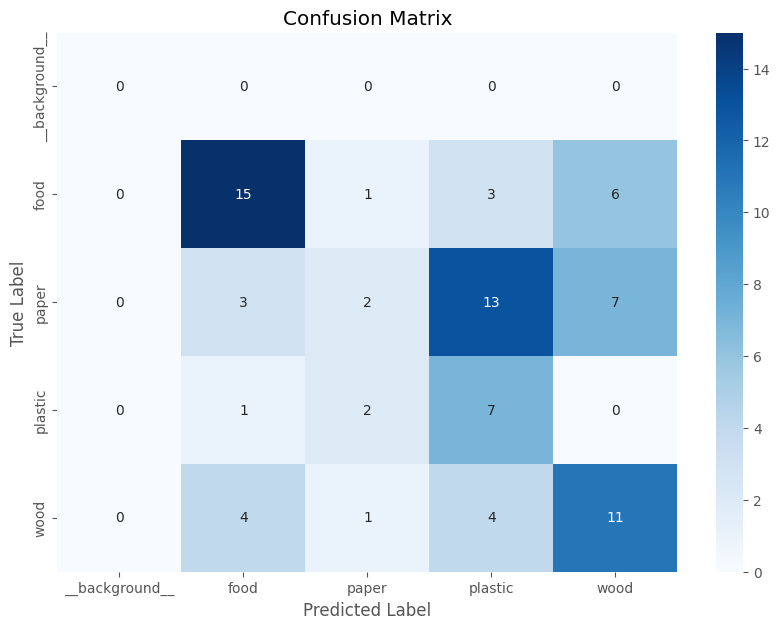

/usr/local/lib/python3.11/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


TP: 2926, TN: 33976, FP: 7424, FN: 7424
Precision: 28.27
Recall: 28.27
F1 Score: 28.2705
Class 0 - Average Precision (AP): Not available or NaN
Class 1 - Average Precision (AP): Not available or NaN
Class 2 - Average Precision (AP): Not available or NaN
Class 3 - Average Precision (AP): Not available or NaN
mAP_50: 28.855
mAP_50_95: 11.863


In [9]:
# Evaluation function
def validate(valid_data_loader, model):
    print('Validating')
    model.eval()

    # Initialize tqdm progress bar.
    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))
    target = []
    preds = []

    # Initialize TP, TN, FP, FN
    TP = 0
    TN = 0
    FP = 0
    FN = 0

    # Inisialisasi confusion matrix
    conf_matrix = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=int)

    for i, data in enumerate(prog_bar):
        images, targets = data

        images = list(image.to(DEVICE) for image in images)
        targets = [{k: v.to(DEVICE) for k, v in t.items()} for t in targets]

        with torch.no_grad():
            outputs = model(images, targets)

        # For mAP calculation using Torchmetrics.
        #####################################
        for i in range(len(images)):
            true_dict = dict()
            preds_dict = dict()
            true_dict['boxes'] = targets[i]['boxes'].detach().cpu()
            true_dict['labels'] = targets[i]['labels'].detach().cpu()
            preds_dict['boxes'] = outputs[i]['boxes'].detach().cpu()
            preds_dict['scores'] = outputs[i]['scores'].detach().cpu()
            preds_dict['labels'] = outputs[i]['labels'].detach().cpu()
            preds.append(preds_dict)
            target.append(true_dict)

            true_labels = targets[i]['labels'].detach().cpu().numpy()
            pred_labels = outputs[i]['labels'].detach().cpu().numpy()

            # Check if pred_labels is empty before iterating
            if len(pred_labels) > 0:
                # Update confusion matrix
                for i in range(len(true_labels)):
                    true_class = true_labels[i]
                    pred_class = pred_labels[i]
                    conf_matrix[true_class, pred_class] += 1

                # Hitung TP, TN, FN, FP untuk setiap kelas
                for class_id in range(NUM_CLASSES):
                    TP += np.sum((pred_labels == class_id) & (true_labels == class_id))
                    TN += np.sum((pred_labels != class_id) & (true_labels != class_id))
                    FP += np.sum((pred_labels == class_id) & (true_labels != class_id))
                    FN += np.sum((pred_labels != class_id) & (true_labels == class_id))

        #####################################

    # Plot confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues",
                xticklabels=CLASSES, yticklabels=CLASSES)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

    metric = MeanAveragePrecision(class_metrics=True) # Enable class metrics
    metric.update(preds, target)
    metric_summary = metric.compute()

    # Cetak hasil TP, TN, FN, FP
    print(f"TP: {TP}, TN: {TN}, FP: {FP}, FN: {FN}")

    # Calculate F1 score
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    print(f"Precision: {precision *100:.2f}")
    print(f"Recall: {recall *100:.2f}")
    print(f"F1 Score: {f1_score *100:.4f}")

    # Check if 'map_per_class' is present and iterable
    if 'map_per_class' in metric_summary and isinstance(metric_summary['map_per_class'], (list, tuple, torch.Tensor)):
        class_names = ['__background__', 'food', 'paper', 'plastic', 'wood']  # Your class names
        for class_idx, ap in enumerate(metric_summary['map_per_class']):
            if not torch.isnan(ap) and ap.dim() > 0: # Check for NaN and 0-d tensors
                print(f"Class {class_idx} - Average Precision (AP): {ap:.4f}")
            else:
                print(f"Class {class_idx} - Average Precision (AP): Not available or NaN")
    else:
        print("Per-class mAP not available in metric_summary")

    # Return TP, TN, FP, FN along with other metrics
    metric_summary['TP'] = TP
    metric_summary['TN'] = TN
    metric_summary['FP'] = FP
    metric_summary['FN'] = FN
    metric_summary['F1'] = f1_score # Add F1 score to the dictionary

    return metric_summary

if __name__ == '__main__':
    # Load the best model and trained weights.
    model = create_model(num_classes=NUM_CLASSES, size=640)
    checkpoint = torch.load('/content/drive/MyDrive/Skripsi/CobaSkripsi7/outputs/best_model_resnet34_sgd_0.01.pth', map_location=DEVICE)
    # checkpoint = torch.load('/content/drive/MyDrive/Skripsi/CobaSkripsi7/outputs/best_model_sgd_resnet101.pth', map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.to(DEVICE).eval()

    test_dataset = create_valid_dataset(
        '/content/drive/MyDrive/Skripsi/CobaSkripsi7/data/test'
    )
    test_loader = create_valid_loader(test_dataset, num_workers=NUM_WORKERS)

    metric_summary = validate(test_loader, model)
    print(f"mAP_50: {metric_summary['map_50']*100:.3f}")
    print(f"mAP_50_95: {metric_summary['map']*100:.3f}")

<ipython-input-11-9ba6f4a133fb>:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/content/drive/MyDrive/Skripsi/CobaSkripsi7/outputs/best_model_res

Test instances: 80
(640, 640, 3)


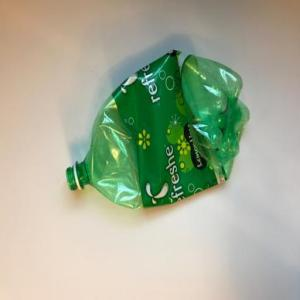

Image 1 done...
--------------------------------------------------
(640, 640, 3)


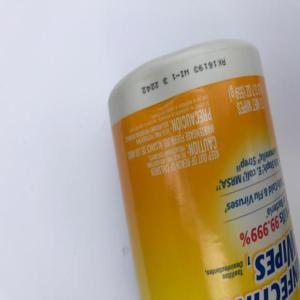

Image 2 done...
--------------------------------------------------
(640, 640, 3)


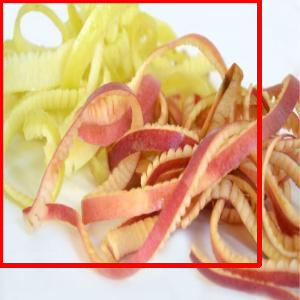

Image 3 done...
--------------------------------------------------
(640, 640, 3)


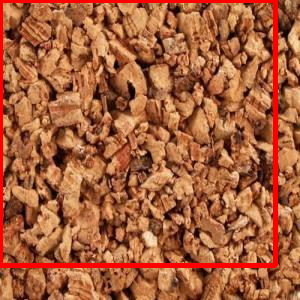

Image 4 done...
--------------------------------------------------
(640, 640, 3)


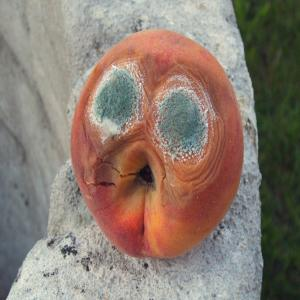

Image 5 done...
--------------------------------------------------
(640, 640, 3)


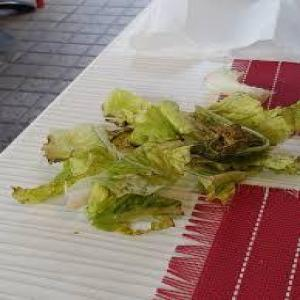

Image 6 done...
--------------------------------------------------
(640, 640, 3)


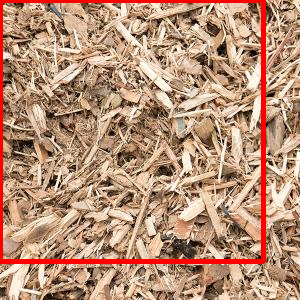

Image 7 done...
--------------------------------------------------
(640, 640, 3)


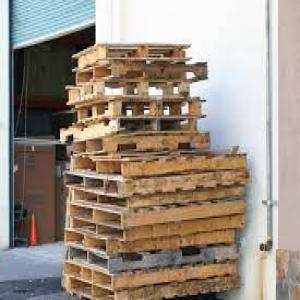

Image 8 done...
--------------------------------------------------
(640, 640, 3)


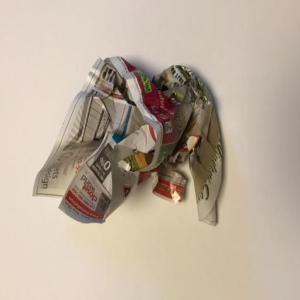

Image 9 done...
--------------------------------------------------
(640, 640, 3)


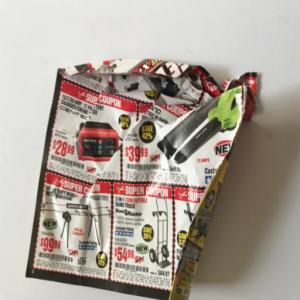

Image 10 done...
--------------------------------------------------
(640, 640, 3)


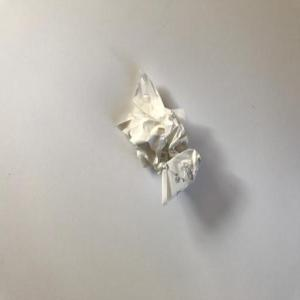

Image 11 done...
--------------------------------------------------
(640, 640, 3)


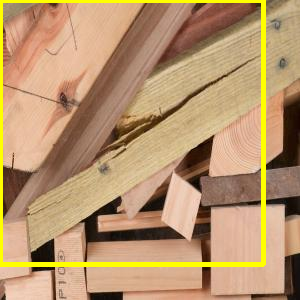

Image 12 done...
--------------------------------------------------
(640, 640, 3)


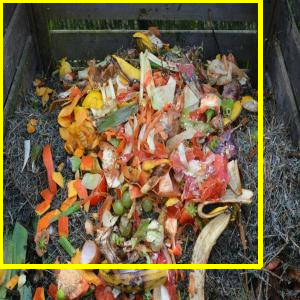

Image 13 done...
--------------------------------------------------
(640, 640, 3)


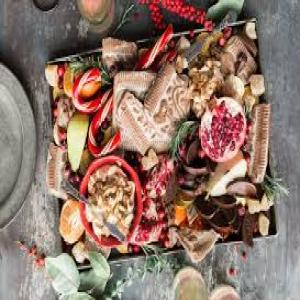

Image 14 done...
--------------------------------------------------
(640, 640, 3)


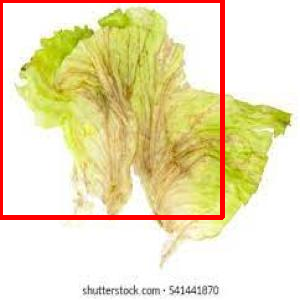

Image 15 done...
--------------------------------------------------
(640, 640, 3)


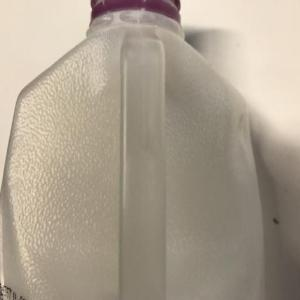

Image 16 done...
--------------------------------------------------
(640, 640, 3)


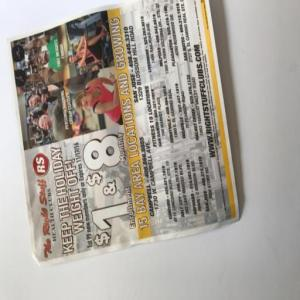

Image 17 done...
--------------------------------------------------
(640, 640, 3)


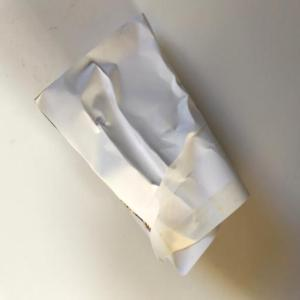

Image 18 done...
--------------------------------------------------
(640, 640, 3)


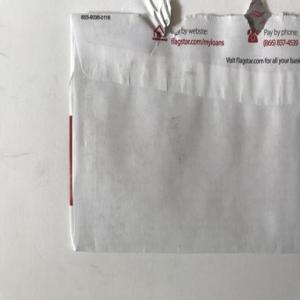

Image 19 done...
--------------------------------------------------
(640, 640, 3)


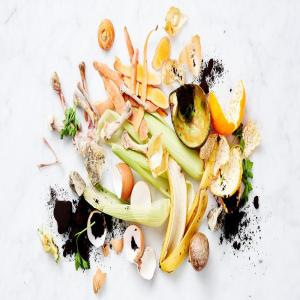

Image 20 done...
--------------------------------------------------
(640, 640, 3)


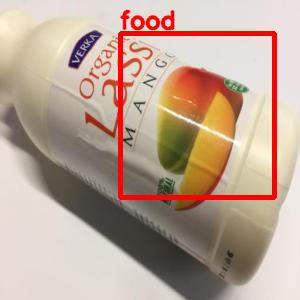

Image 21 done...
--------------------------------------------------
(640, 640, 3)


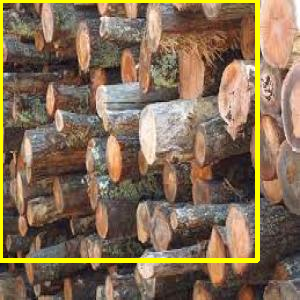

Image 22 done...
--------------------------------------------------
(640, 640, 3)


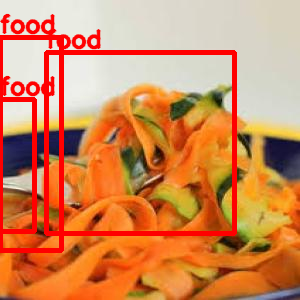

Image 23 done...
--------------------------------------------------
(640, 640, 3)


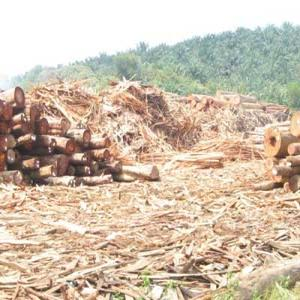

Image 24 done...
--------------------------------------------------
(640, 640, 3)


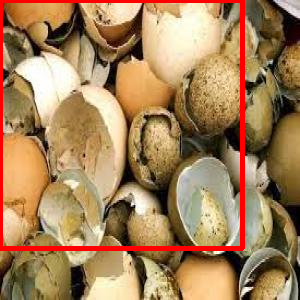

Image 25 done...
--------------------------------------------------
(640, 640, 3)


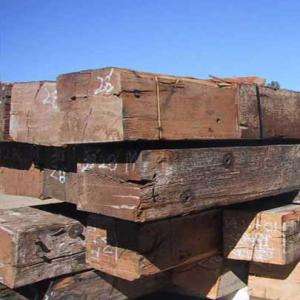

Image 26 done...
--------------------------------------------------
(640, 640, 3)


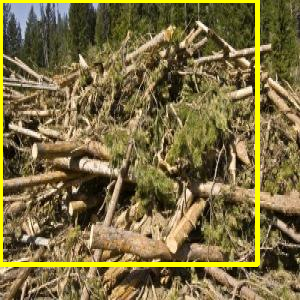

Image 27 done...
--------------------------------------------------
(640, 640, 3)


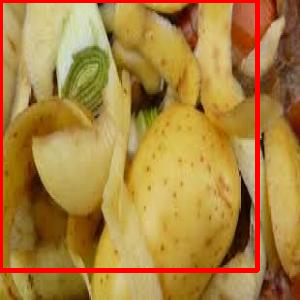

Image 28 done...
--------------------------------------------------
(640, 640, 3)


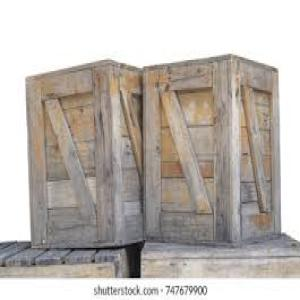

Image 29 done...
--------------------------------------------------
(640, 640, 3)


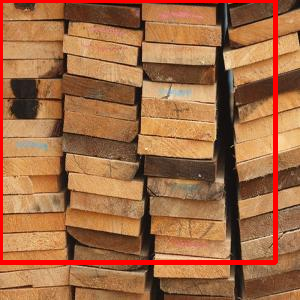

Image 30 done...
--------------------------------------------------
(640, 640, 3)


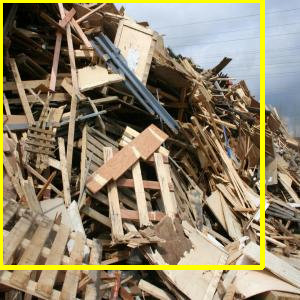

Image 31 done...
--------------------------------------------------
(640, 640, 3)


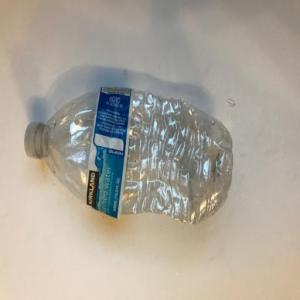

Image 32 done...
--------------------------------------------------
(640, 640, 3)


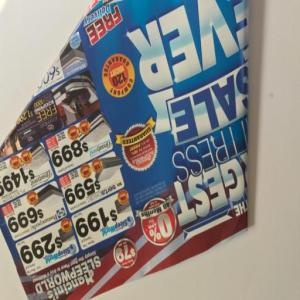

Image 33 done...
--------------------------------------------------
(640, 640, 3)


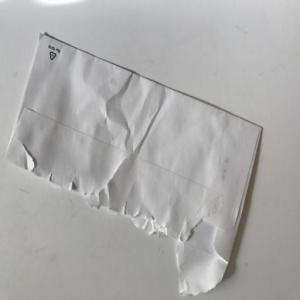

Image 34 done...
--------------------------------------------------
(640, 640, 3)


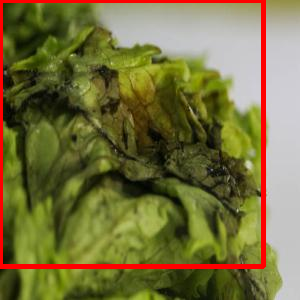

Image 35 done...
--------------------------------------------------
(640, 640, 3)


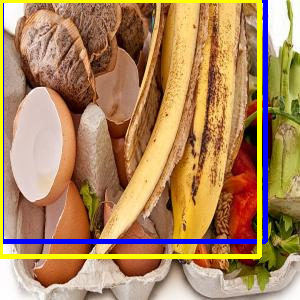

Image 36 done...
--------------------------------------------------
(640, 640, 3)


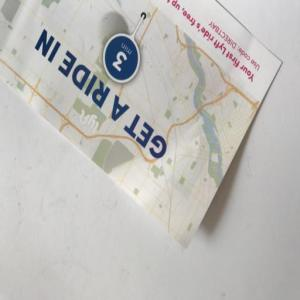

Image 37 done...
--------------------------------------------------
(640, 640, 3)


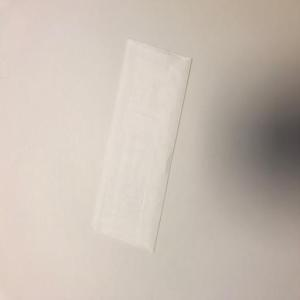

Image 38 done...
--------------------------------------------------
(640, 640, 3)


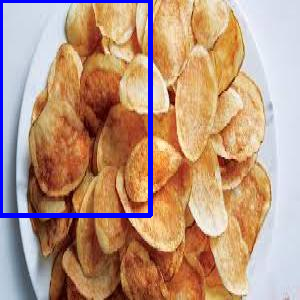

Image 39 done...
--------------------------------------------------
(640, 640, 3)


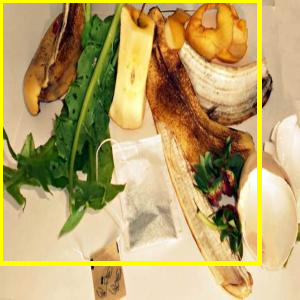

Image 40 done...
--------------------------------------------------
(640, 640, 3)


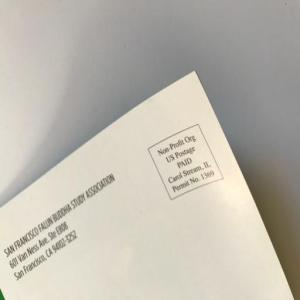

Image 41 done...
--------------------------------------------------
(640, 640, 3)


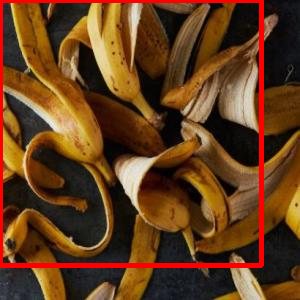

Image 42 done...
--------------------------------------------------
(640, 640, 3)


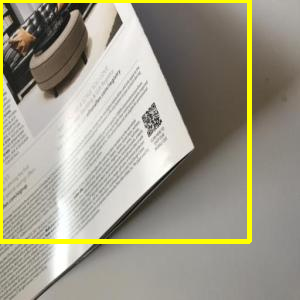

Image 43 done...
--------------------------------------------------
(640, 640, 3)


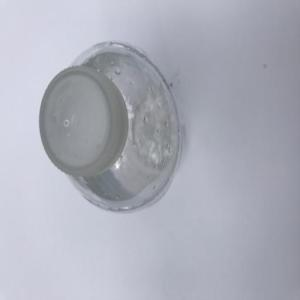

Image 44 done...
--------------------------------------------------
(640, 640, 3)


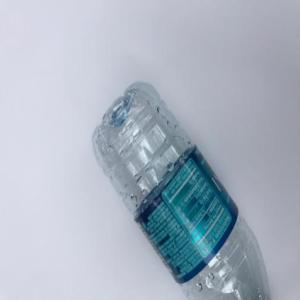

Image 45 done...
--------------------------------------------------
(640, 640, 3)


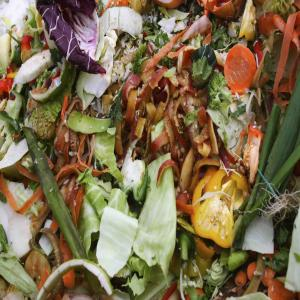

Image 46 done...
--------------------------------------------------
(640, 640, 3)


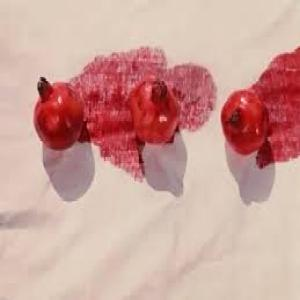

Image 47 done...
--------------------------------------------------
(640, 640, 3)


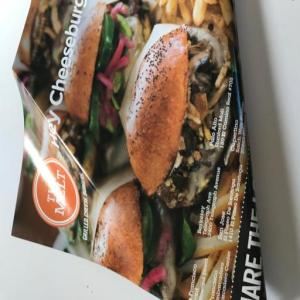

Image 48 done...
--------------------------------------------------
(640, 640, 3)


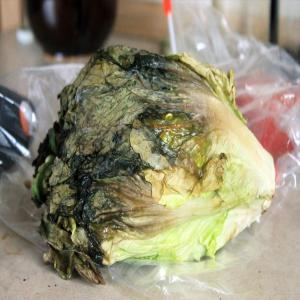

Image 49 done...
--------------------------------------------------
(640, 640, 3)


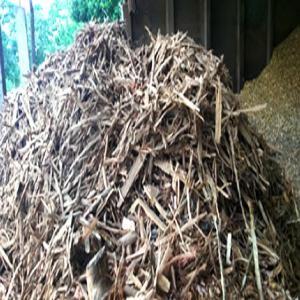

Image 50 done...
--------------------------------------------------
(640, 640, 3)


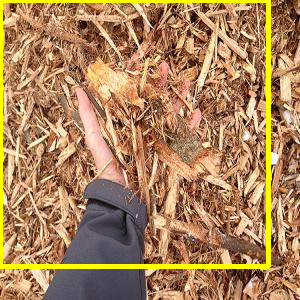

Image 51 done...
--------------------------------------------------
(640, 640, 3)


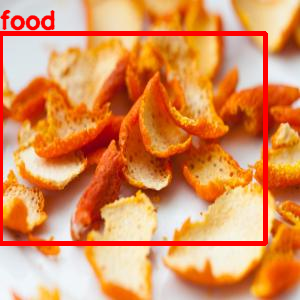

Image 52 done...
--------------------------------------------------
(640, 640, 3)


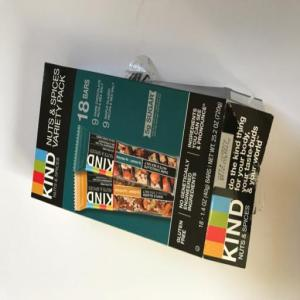

Image 53 done...
--------------------------------------------------
(640, 640, 3)


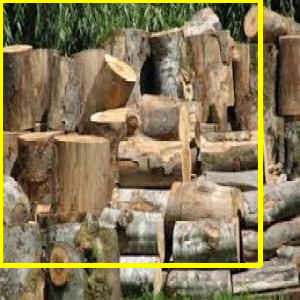

Image 54 done...
--------------------------------------------------
(640, 640, 3)


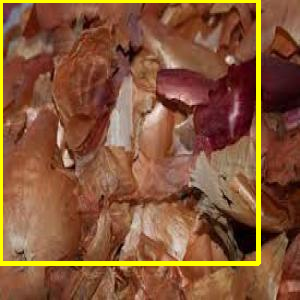

Image 55 done...
--------------------------------------------------
(640, 640, 3)


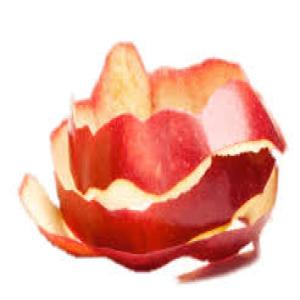

Image 56 done...
--------------------------------------------------
(640, 640, 3)


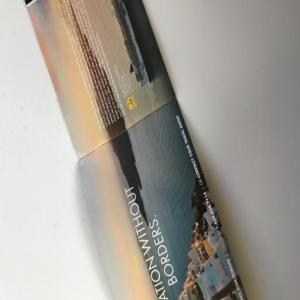

Image 57 done...
--------------------------------------------------
(640, 640, 3)


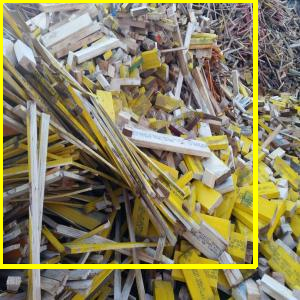

Image 58 done...
--------------------------------------------------
(640, 640, 3)


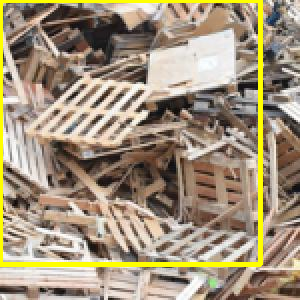

Image 59 done...
--------------------------------------------------
(640, 640, 3)


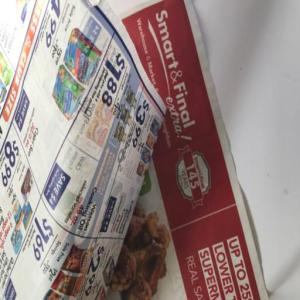

Image 60 done...
--------------------------------------------------
(640, 640, 3)


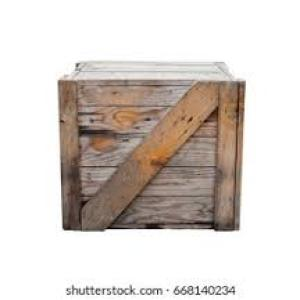

Image 61 done...
--------------------------------------------------
(640, 640, 3)


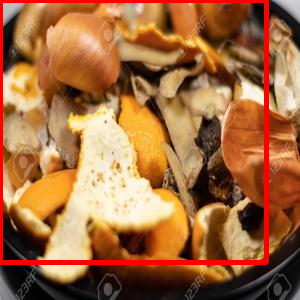

Image 62 done...
--------------------------------------------------
(640, 640, 3)


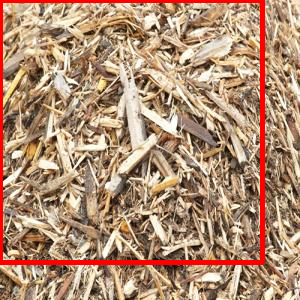

Image 63 done...
--------------------------------------------------
(640, 640, 3)


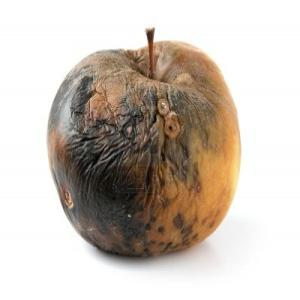

Image 64 done...
--------------------------------------------------
(640, 640, 3)


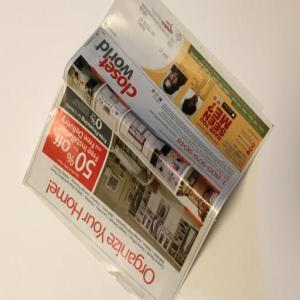

Image 65 done...
--------------------------------------------------
(640, 640, 3)


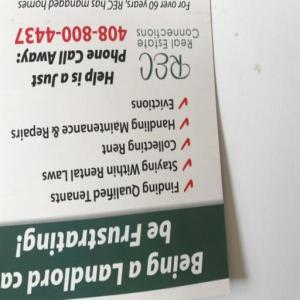

Image 66 done...
--------------------------------------------------
(640, 640, 3)


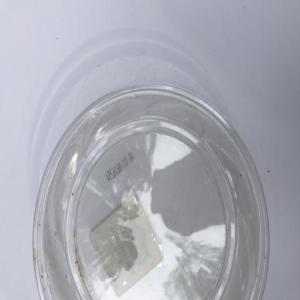

Image 67 done...
--------------------------------------------------
(640, 640, 3)


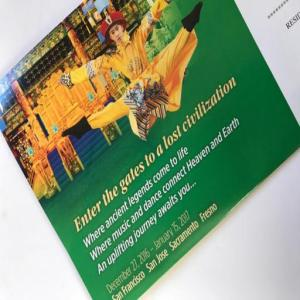

Image 68 done...
--------------------------------------------------
(640, 640, 3)


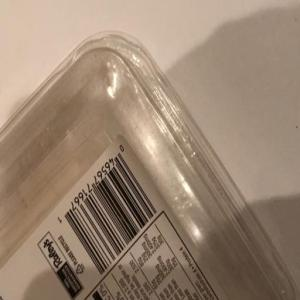

Image 69 done...
--------------------------------------------------
(640, 640, 3)


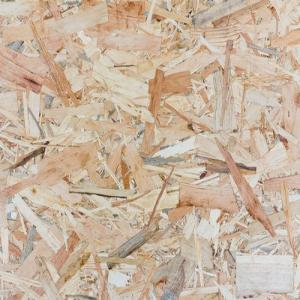

Image 70 done...
--------------------------------------------------
(640, 640, 3)


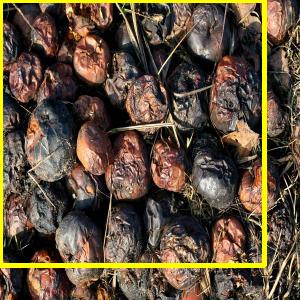

Image 71 done...
--------------------------------------------------
(640, 640, 3)


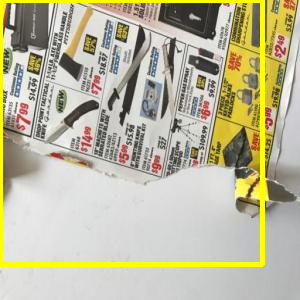

Image 72 done...
--------------------------------------------------
(640, 640, 3)


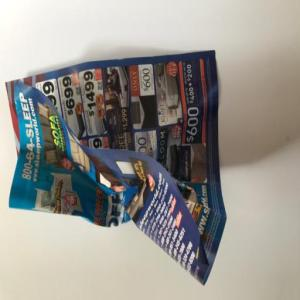

Image 73 done...
--------------------------------------------------
(640, 640, 3)


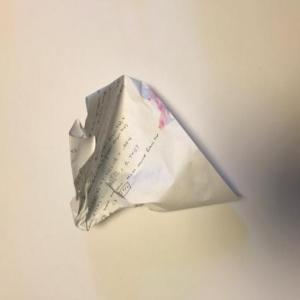

Image 74 done...
--------------------------------------------------
(640, 640, 3)


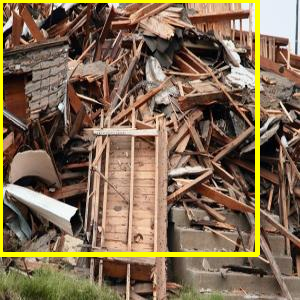

Image 75 done...
--------------------------------------------------
(640, 640, 3)


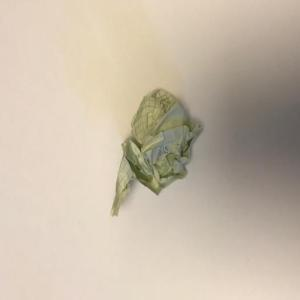

Image 76 done...
--------------------------------------------------
(640, 640, 3)


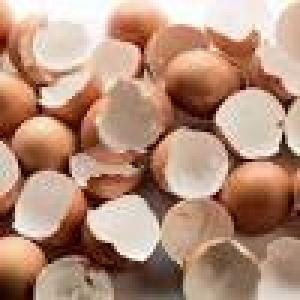

Image 77 done...
--------------------------------------------------
(640, 640, 3)


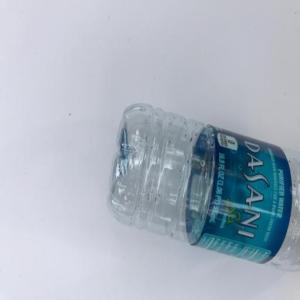

Image 78 done...
--------------------------------------------------
(640, 640, 3)


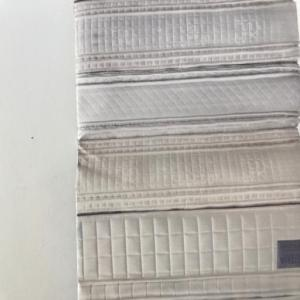

Image 79 done...
--------------------------------------------------
(640, 640, 3)


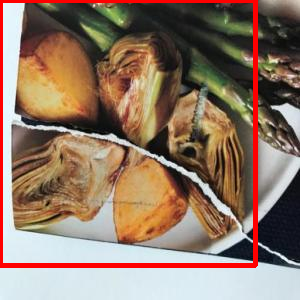

Image 80 done...
--------------------------------------------------
TEST PREDICTIONS COMPLETE
Average FPS: 0.682


In [ ]:
np.random.seed(42)

# Definisikan argumen secara manual untuk Colab
args = {
    'input': '/content/drive/MyDrive/Skripsi/CobaSkripsi7/data/test',  # Path ke folder input
    'imgsz': 640,  # Ukuran gambar yang diinginkan
    'threshold': 0.25  # Threshold deteksi
}

os.makedirs('/content/drive/MyDrive/Skripsi/CobaSkripsi7/inference_outputs/images_resnet34_sgd_0.01', exist_ok=True)

# Define COLORS and CLASSES
COLORS = [[0, 0, 0], [255, 0, 0], [0, 255, 0], [0, 0, 255], [255, 255, 0]]  # Tambahkan warna sesuai kebutuhan
CLASSES = ['__background__', 'food', 'paper', 'plastic', 'wood']  # Sesuaikan dengan dataset Anda

# Load model terbaik
model = create_model(num_classes=NUM_CLASSES, size=640)
checkpoint = torch.load('/content/drive/MyDrive/Skripsi/CobaSkripsi7/outputs/best_model_resnet34_sgd_0.01.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# Path ke folder gambar uji
DIR_TEST = args['input']
test_images = glob.glob(f"{DIR_TEST}/*.jpg")
print(f"Test instances: {len(test_images)}")

frame_count = 0 # To count total frames.
total_fps = 0 # To get the final frames per second.

for i in range(len(test_images)):
    # Get the image file name for saving output later on.
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image = cv2.imread(test_images[i])
    orig_image = image.copy()
    if args['imgsz'] is not None:
        image = cv2.resize(image, (args['imgsz'], args['imgsz']))
    print(image.shape)
    # BGR to RGB.
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
    # Make the pixel range between 0 and 1.
    image /= 255.0
    # Bring color channels to front (H, W, C) => (C, H, W).
    image_input = np.transpose(image, (2, 0, 1)).astype(np.float32)
    # Convert to tensor.
    image_input = torch.tensor(image_input, dtype=torch.float).to(DEVICE) # Using DEVICE instead of .cuda()
    # image_input = torch.tensor(image_input, dtype=torch.float).cuda()
    # Add batch dimension.
    image_input = torch.unsqueeze(image_input, 0)
    start_time = time.time()
    # Predictions
    with torch.no_grad():
        outputs = model(image_input.to(DEVICE))
    end_time = time.time()

    # Get the current fps.
    fps = 1 / (end_time - start_time)
    # Total FPS till current frame.
    total_fps += fps
    frame_count += 1

    # Load all detection to CPU for further operations.
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    # Carry further only if there are detected boxes.
    if len(outputs[0]['boxes']) != 0:
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()
        # Filter out boxes according to `detection_threshold`.
        boxes = boxes[scores >= args['threshold']].astype(np.int32)
        draw_boxes = boxes.copy()
        # Get all the predicited class names.
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]

        # Draw the bounding boxes and write the class name on top of it.
        for j, box in enumerate(draw_boxes):
            class_name = pred_classes[j]
            color = COLORS[CLASSES.index(class_name)]
            # Recale boxes.
            xmin = int((box[0] / image.shape[1]) * orig_image.shape[1])
            ymin = int((box[1] / image.shape[0]) * orig_image.shape[0])
            xmax = int((box[2] / image.shape[1]) * orig_image.shape[1])
            ymax = int((box[3] / image.shape[0]) * orig_image.shape[0])
            cv2.rectangle(orig_image,
                        (xmin, ymin),
                        (xmax, ymax),
                        color[::-1],
                        3)
            cv2.putText(orig_image,
                        class_name,
                        (xmin, ymin-5),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.8,
                        color[::-1],
                        2,
                        lineType=cv2.LINE_AA)

        # Menampilkan hasil prediksi
        cv2_imshow(orig_image)
        cv2.imwrite(f"/content/drive/MyDrive/Skripsi/CobaSkripsi7/inference_outputs/images_resnet34_sgd_0.01/{image_name}.jpg", orig_image)
    print(f"Image {i+1} done...")
    print('-'*50)

print('TEST PREDICTIONS COMPLETE')
# cv2.destroyAllWindows()
# Calculate and print the average FPS.
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")